In [71]:
# Origin: Code for week 6 of programming class.
# Author: Tyler Abbot
# Title: week_6_code.ipynb
# Last modified: 2016.08.08

# Introduction

Today's class will introduce you to **data analysis tools in R - the dataframe**. 

## Today's Objective

Our goal for the day is to become familiar with some of the tools available for data analysis in R, in particular for building data sets. We would like to achieve the following objectives:
1. Learn about importing and exporting data.
2. Get introduced to the data frame and some of its methods.
4. Learn about tools for descriptive statistics on data frames.
5. Study several useful packages for data analysis.

If by the end of the class, you feel we haven't sufficiently covered one of these, speak up!

## A Working Example : Financial Data

Today's example (as well as next week's) comes from finance. Why, you ask? Financial data is readily available in a clean and easy to use form from Yahoo Finance. We can avoid missing data problems and just look at the basic functions.

Our goal for the day will be to construct a dataset from yahoo finance. We will endeavor to do this as programmatically as possible.

We will work to study a **portfolio**, or set of stock tickers and their accompanying weights, based on their **daily returns**. We will study only **Exchange Traded Funds (ETF's)**, which are publicly traded funds which attempt to track different indices. These are great for macro or sector strategies and provide instant diversification. If none of this is of interest to you, no worries, the statistics will be the same as for unemployment rates and wages.

Today all we will do is build our dataset and look at some descriptive statistics. Next week we will fit linear models and study the beta of each ETF.

Here's a list of the top 20 most traded ETF's according to [etfdb.com](https://etfdb.com), which we will study today:

Symbol | Name 
-----|-----
SPY | SPDR S&P 500 ETF 
GDX |	VanEck Vectors Gold Miners ETF 
VXX |	iPath® S&P 500 VIX Short-Term Futures ETN
EEM |	iShares MSCI Emerging Markets ETF
TVIX |	VelocityShares Daily 2X VIX Short-Term ETN
XLF |	Financial Select Sector SPDR Fund
EWJ |	iShares MSCI Japan ETF
XIV |	VelocityShares Daily Inverse VIX Short-Term ETN
IWM	| iShares Russell 2000 ETF	
EFA |	iShares MSCI EAFE ETF	
DUST |	Direxion Daily Gold Miners Index Bear 3x Shares ETF
USO |	United States Oil Fund	
QQQ |	PowerShares QQQ ETF	
FXI |	iShares China Large-Cap ETF	
EWZ |	iShares MSCI Brazil Capped ETF	
UWTI |	VelocityShares 3x Long Crude Oil ETN
VWO |	Vanguard FTSE Emerging Markets ETF
GDXJ |	VanEck Vectors Junior Gold Miners ETF	
XOP |	SPDR S&P Oil & Gas Exploration & Production ETF
HYG |	iShares iBoxx $ High Yield Corporate Bond ETF

These different ETF's all have different characteristics and different correlations with the market. We will use R to learn more about them in a systematic way.

## Importing Data
First off, head to [Yahoo Finance](https://finance.yahoo.com) to check out the site. Use the search bar (or the following link) to navigat to the page for the [SPY](https://finance.yahoo.com/quote/SPY?p=SPY). The SPY tracks the S&P 500 and will be the first data series we look to download.

Click on the link for [Historical Data](https://finance.yahoo.com/quote/SPY/history?p=SPY) and adjust the time period to the following: Aug 09, 2000 - Aug 09, 2016. Be sure the **Frequency** is set to "Daily", then click "Apply". Finally, click "Download Data".

You should now have a file called `table.csv` in your downloads folder. Move this into a folder in your course repository. I use a `data` folder under `Week6` for raw data files.

Now, for the fun part! We would like to import this data file into R. There are [many tools to do this depending on the data type](http://www.r-tutor.com/r-introduction/data-frame/data-import), but given our file is a `.csv` we can use the `read_csv()` function.

In [2]:
?read.csv

read.table {utils},R Documentation
file,"the name of the file which the data are to be read from. Each row of the table appears as one line of the file. If it does not contain an absolute path, the file name is relative to the current working directory, getwd(). Tilde-expansion is performed where supported. This can be a compressed file (see file). Alternatively, file can be a readable text-mode connection (which will be opened for reading if necessary, and if so closed (and hence destroyed) at the end of the function call). (If stdin() is used, the prompts for lines may be somewhat confusing. Terminate input with a blank line or an EOF signal, Ctrl-D on Unix and Ctrl-Z on Windows. Any pushback on stdin() will be cleared before return.) file can also be a complete URL. (For the supported URL schemes, see the ‘URLs’ section of the help for url.)"
header,"a logical value indicating whether the file contains the names of the variables as its first line. If missing, the value is determined from the file format: header is set to TRUE if and only if the first row contains one fewer field than the number of columns."
sep,"the field separator character. Values on each line of the file are separated by this character. If sep = """" (the default for read.table) the separator is ‘white space’, that is one or more spaces, tabs, newlines or carriage returns."
quote,"the set of quoting characters. To disable quoting altogether, use quote = """". See scan for the behaviour on quotes embedded in quotes. Quoting is only considered for columns read as character, which is all of them unless colClasses is specified."
dec,the character used in the file for decimal points.
numerals,"string indicating how to convert numbers whose conversion to double precision would lose accuracy, see type.convert. Can be abbreviated. (Applies also to complex-number inputs.)"
row.names,"a vector of row names. This can be a vector giving the actual row names, or a single number giving the column of the table which contains the row names, or character string giving the name of the table column containing the row names. If there is a header and the first row contains one fewer field than the number of columns, the first column in the input is used for the row names. Otherwise if row.names is missing, the rows are numbered. Using row.names = NULL forces row numbering. Missing or NULL row.names generate row names that are considered to be ‘automatic’ (and not preserved by as.matrix)."
col.names,"a vector of optional names for the variables. The default is to use ""V"" followed by the column number."
as.is,"the default behavior of read.table is to convert character variables (which are not converted to logical, numeric or complex) to factors. The variable as.is controls the conversion of columns not otherwise specified by colClasses. Its value is either a vector of logicals (values are recycled if necessary), or a vector of numeric or character indices which specify which columns should not be converted to factors. Note: to suppress all conversions including those of numeric columns, set colClasses = ""character"". Note that as.is is specified per column (not per variable) and so includes the column of row names (if any) and any columns to be skipped."
na.strings,"a character vector of strings which are to be interpreted as NA values. Blank fields are also considered to be missing values in logical, integer, numeric and complex fields. Note that the test happens after white space is stripped from the input, so na.strings values may need their own white space stripped in advance."


In [3]:
mydir <- "/home/tmabbot/MEGA/Teaching/Programming/Courses/Week6/data/"
data_SPY <- read.csv(paste(mydir, "table.csv", sep=""))

In [4]:
data_SPY

,Date,Open,High,Low,Close,Volume,Adj.Close
1,2016-08-08,218.399994,218.520004,217.740005,218.050003,38618500,218.050003
2,2016-08-05,216.410004,218.229996,216.410004,218.179993,71892200,218.179993
3,2016-08-04,216.309998,216.779999,214.25,216.410004,46585500,216.410004
4,2016-08-03,215.479996,216.25,215.130005,216.179993,53993600,216.179993
5,2016-08-02,216.649994,216.830002,214.570007,215.550003,92295500,215.550003
6,2016-08-01,217.190002,217.649994,216.410004,216.940002,73311400,216.940002
7,2016-07-29,216.460007,217.539993,216.130005,217.119995,79519400,217.119995
8,2016-07-28,216.289993,217.110001,215.75,216.770004,65035700,216.770004
9,2016-07-27,217.190002,217.270004,215.619995,216.520004,84083900,216.520004
10,2016-07-26,216.529999,217.169998,215.759995,216.75,70080500,216.75


That's it! Now we have a shiny new dataframe to work with, but we haven't learned anything *about* dataframes!

## Dataframes
A **dataframe** is a data type in R:

In [7]:
typeof(data_SPY)
class(data_SPY)

[1] "list"

[1] "data.frame"

Well... a class, but that's a technical point we don't particularly care about.

As you can see above, the dataframe has a special structure when compared to a matrix. It has column names and row numbers. In fact, we can reference these values explicitly:

In [8]:
rownames(data_SPY)

[1] "1"    "2"    "3"    "4"    "5"    "6"    "7"    "8"    "9"    "10"  
  [11] "11"   "12"   "13"   "14"   "15"   "16"   "17"   "18"   "19"   "20"  
  [21] "21"   "22"   "23"   "24"   "25"   "26"   "27"   "28"   "29"   "30"  
  [31] "31"   "32"   "33"   "34"   "35"   "36"   "37"   "38"   "39"   "40"  
  [41] "41"   "42"   "43"   "44"   "45"   "46"   "47"   "48"   "49"   "50"  
  [51] "51"   "52"   "53"   "54"   "55"   "56"   "57"   "58"   "59"   "60"  
  [61] "61"   "62"   "63"   "64"   "65"   "66"   "67"   "68"   "69"   "70"  
  [71] "71"   "72"   "73"   "74"   "75"   "76"   "77"   "78"   "79"   "80"  
  [81] "81"   "82"   "83"   "84"   "85"   "86"   "87"   "88"   "89"   "90"  
  [91] "91"   "92"   "93"   "94"   "95"   "96"   "97"   "98"   "99"   "100" 
 [101] "101"  "102"  "103"  "104"  "105"  "106"  "107"  "108"  "109"  "110" 
 [111] "111"  "112"  "113"  "114"  "115"  "116"  "117"  "118"  "119"  "120" 
 [121] "121"  "122"  "123"  "124"  "125"  "126"  "127"  "128"  "129"  "130" 
 [131] "131"  "132"  "133"  "134"  "135"  "136"  "137"  "138"  "139"  "140" 
 [141] "141"  "142"  "143"  "144"  "145"  "146"  "147"  "148"  "149"  "150" 
 [151] "151"  "152"  "153"  "154"  "155"  "156"  "157"  "158"  "159"  "160" 
 [161] "161"  "162"  "163"  "164"  "165"  "166"  "167"  "168"  "169"  "170" 
 [171] "171"  "172"  "173"  "174"  "175"  "176"  "177"  "178"  "179"  "180" 
 [181] "181"  "182"  "183"  "184"  "185"  "186"  "187"  "188"  "189"  "190" 
 [191] "191"  "192"  "193"  "194"  "195"  "196"  "197"  "198"  "199"  "200" 
 [201] "201"  "202"  "203"  "204"  "205"  "206"  "207"  "208"  "209"  "210" 
 [211] "211"  "212"  "213"  "214"  "215"  "216"  "217"  "218"  "219"  "220" 
 [221] "221"  "222"  "223"  "224"  "225"  "226"  "227"  "228"  "229"  "230" 
 [231] "231"  "232"  "233"  "234"  "235"  "236"  "237"  "238"  "239"  "240" 
 [241] "241"  "242"  "243"  "244"  "245"  "246"  "247"  "248"  "249"  "250" 
 [251] "251"  "252"  "253"  "254"  "255"  "256"  "257"  "258"  "259"  "260" 
 [261] "261"  "262"  "263"  "264"  "265"  "266"  "267"  "268"  "269"  "270" 
 [271] "271"  "272"  "273"  "274"  "275"  "276"  "277"  "278"  "279"  "280" 
 [281] "281"  "282"  "283"  "284"  "285"  "286"  "287"  "288"  "289"  "290" 
 [291] "291"  "292"  "293"  "294"  "295"  "296"  "297"  "298"  "299"  "300" 
 [301] "301"  "302"  "303"  "304"  "305"  "306"  "307"  "308"  "309"  "310" 
 [311] "311"  "312"  "313"  "314"  "315"  "316"  "317"  "318"  "319"  "320" 
 [321] "321"  "322"  "323"  "324"  "325"  "326"  "327"  "328"  "329"  "330" 
 [331] "331"  "332"  "333"  "334"  "335"  "336"  "337"  "338"  "339"  "340" 
 [341] "341"  "342"  "343"  "344"  "345"  "346"  "347"  "348"  "349"  "350" 
 [351] "351"  "352"  "353"  "354"  "355"  "356"  "357"  "358"  "359"  "360" 
 [361] "361"  "362"  "363"  "364"  "365"  "366"  "367"  "368"  "369"  "370" 
 [371] "371"  "372"  "373"  "374"  "375"  "376"  "377"  "378"  "379"  "380" 
 [381] "381"  "382"  "383"  "384"  "385"  "386"  "387"  "388"  "389"  "390" 
 [391] "391"  "392"  "393"  "394"  "395"  "396"  "397"  "398"  "399"  "400" 
 [401] "401"  "402"  "403"  "404"  "405"  "406"  "407"  "408"  "409"  "410" 
 [411] "411"  "412"  "413"  "414"  "415"  "416"  "417"  "418"  "419"  "420" 
 [421] "421"  "422"  "423"  "424"  "425"  "426"  "427"  "428"  "429"  "430" 
 [431] "431"  "432"  "433"  "434"  "435"  "436"  "437"  "438"  "439"  "440" 
 [441] "441"  "442"  "443"  "444"  "445"  "446"  "447"  "448"  "449"  "450" 
 [451] "451"  "452"  "453"  "454"  "455"  "456"  "457"  "458"  "459"  "460" 
 [461] "461"  "462"  "463"  "464"  "465"  "466"  "467"  "468"  "469"  "470" 
 [471] "471"  "472"  "473"  "474"  "475"  "476"  "477"  "478"  "479"  "480" 
 [481] "481"  "482"  "483"  "484"  "485"  "486"  "487"  "488"  "489"  "490" 
 [491] "491"  "492"  "493"  "494"  "495"  "496"  "497"  "498"  "499"  "500" 
 [501] "501"  "502"  "503"  "504"  "505"  "506"  "507"  "508"  "509"  "510" 
 [511] "511"  "512"  "513"  "514"  "515"  "516"  "517"  "518"  "519"  "520" 

In [9]:
colnames(data_SPY)

[1] "Date"      "Open"      "High"      "Low"       "Close"     "Volume"   
[7] "Adj.Close"

We can also reference specific entries in the dataframe using either the matrix style index or the column and row names:

In [13]:
data_SPY[1, 1]
data_SPY[1, 'Date']
data_SPY['1', 'Date']

[1] 2016-08-08
4024 Levels: 2000-08-09 2000-08-10 2000-08-11 2000-08-14 ... 2016-08-08

[1] 2016-08-08
4024 Levels: 2000-08-09 2000-08-10 2000-08-11 2000-08-14 ... 2016-08-08

[1] 2016-08-08
4024 Levels: 2000-08-09 2000-08-10 2000-08-11 2000-08-14 ... 2016-08-08

Or we can retrieve rows or columns individually:

In [22]:
data_SPY[['Close']]
# Equivalently
data_SPY$Close

[1] 218.0500 218.1800 216.4100 216.1800 215.5500 216.9400 217.1200 216.7700
   [9] 216.5200 216.7500 216.6500 217.2400 216.2700 217.0900 216.1900 216.4100
  [17] 215.8300 216.1200 214.9200 214.9500 213.4000 212.6500 209.5300 209.6600
  [25] 208.4100 209.9200 209.4800 206.6600 203.2000 199.6000 203.2400 210.8100
  [33] 208.1000 208.4400 207.8500 206.5200 208.3700 207.7500 208.0400 208.4500
  [41] 210.0700 212.0800 212.3700 211.6800 211.3500 210.2800 210.9100 210.2700
  [49] 209.8400 210.2400 209.3400 209.2800 207.8700 205.2100 205.4900 204.2000
  [57] 204.9100 204.8500 206.7800 204.7600 206.5600 206.5000 208.4500 205.8900
  [65] 205.7200 204.9700 205.0100 206.1600 207.9700 206.3300 207.4500 209.3500
  [73] 208.9200 208.6100 208.9700 208.9700 210.1000 209.9000 209.2400 207.7800
  [81] 208.0100 208.0000 205.9200 204.0200 204.5000 203.9500 206.4200 204.1900
  [89] 206.2500 206.9200 205.5200 206.0200 205.1200 203.2400 203.1200 203.2100
  [97] 204.5600 204.6700 204.3800 204.6300 203.3400 202.1700 202.5000 202.7600
 [105] 199.5400 199.3800 198.4000 200.5900 200.4300 199.7800 199.0000 198.1100
 [113] 193.5600 195.0900 195.5400 193.2000 192.3200 194.7800 192.0000 192.0900
 [121] 192.8800 189.7800 186.6300 182.8600 185.2700 185.4300 185.4200 187.9500
 [129] 191.6000 191.3000 190.1600 193.6500 193.7200 189.1100 188.1300 190.2000
 [137] 187.6400 190.5200 186.6900 185.6500 188.0600 187.8100 191.9300 188.8300
 [145] 193.6600 192.1100 191.9200 194.0500 198.8200 201.3600 201.0200 203.8700
 [153] 205.9300 207.4000 205.2100 205.6800 206.0200 203.5000 201.6700 200.0200
 [161] 204.8600 208.0300 205.0300 202.9000 201.8800 205.8700 205.3400 206.9500
 [169] 208.3500 209.6200 205.6100 208.5300 210.6800 208.6900 209.5600 209.3200
 [177] 209.3500 209.0700 209.3100 208.5500 208.7300 205.4700 205.6200 202.5400
 [185] 204.8400 207.7400 208.5600 208.0800 210.0400 210.1500 210.3600 211.0000
 [193] 210.3900 207.9300 208.8300 208.9500 206.6000 207.0000 207.5100 205.2600
 [201] 201.8500 203.1100 203.3700 203.2700 202.3500 199.2900 200.2500 201.5200
 [209] 201.3300 201.2100 199.4100 197.7900 198.4700 195.0000 192.1300 191.6300
 [217] 188.1200 188.0100 192.8700 192.9000 193.6000 193.9000 196.4600 195.4500
 [225] 199.7300 200.1800 198.4500 196.0100 196.7400 195.8500 194.7900 197.4300
 [233] 192.5900 195.5500 195.4100 191.7700 197.6700 199.2800 199.2700 194.4600
 [241] 187.2700 189.5000 197.8300 203.9700 208.3200 209.9800 210.5900 209.4200
 [249] 208.6600 208.9200 208.6600 210.5700 207.9500 208.3500 210.0700 209.3800
 [257] 209.7900 210.5000 210.8200 210.7700 209.3300 206.7900 208.0000 210.1800
 [265] 211.3700 211.7600 212.5900 212.4700 212.3000 210.6100 210.6800 209.7600
 [273] 207.4800 204.9000 204.5300 208.0100 206.7200 207.3200 207.5000 205.8500
 [281] 205.4200 209.8200 209.8600 210.5100 212.0500 211.8900 210.8100 212.7800
 [289] 210.5900 210.2500 209.1000 210.0100 211.6300 210.9600 208.4500 208.4800
 [297] 209.7700 210.1300 211.9200 211.3600 211.5700 211.1400 212.4600 212.7000
 [305] 210.7000 212.9900 213.5000 212.8800 213.0300 213.1000 212.4400 212.2100
 [313] 210.0200 209.9800 210.6100 211.6200 208.8700 208.0400 208.9000 211.3200
 [321] 210.7200 208.4600 210.5700 211.4400 210.7700 211.6500 211.1600 210.6300
 [329] 209.6000 209.8500 207.9500 210.3700 210.4300 209.4900 209.0900 210.0400
 [337] 208.9000 207.9800 207.2800 207.8300 206.4400 205.7000 206.4300 208.2500
 [345] 205.7400 205.2700 205.7600 208.8200 210.0000 210.4100 209.5000 210.4600
 [353] 207.9600 208.5800 205.8300 207.1000 204.5000 204.9800 208.3600 207.5000
 [361] 210.4600 210.2300 211.1200 211.9900 210.6600 211.3800 211.6300 211.8100
 [369] 211.2100 211.2400 209.9800 210.1300 210.1100 209.7800 208.9200 206.9300
 [377] 206.8100 204.6300 205.5500 206.1200 204.0600 204.8400 201.9200 199.4500
 [385] 201.9900 200.1400 202.7400 205.4500 204.9700 206.1000 203.0800 202.0600
 [393] 201.6300 199.0200 200.8600 202.0800 202.6500 204.2500 205.9000 202.3100
 [401] 199.8200 201.7200 205.4300 205.5400 207.6000 2

[1] 218.0500 218.1800 216.4100 216.1800 215.5500 216.9400 217.1200 216.7700
   [9] 216.5200 216.7500 216.6500 217.2400 216.2700 217.0900 216.1900 216.4100
  [17] 215.8300 216.1200 214.9200 214.9500 213.4000 212.6500 209.5300 209.6600
  [25] 208.4100 209.9200 209.4800 206.6600 203.2000 199.6000 203.2400 210.8100
  [33] 208.1000 208.4400 207.8500 206.5200 208.3700 207.7500 208.0400 208.4500
  [41] 210.0700 212.0800 212.3700 211.6800 211.3500 210.2800 210.9100 210.2700
  [49] 209.8400 210.2400 209.3400 209.2800 207.8700 205.2100 205.4900 204.2000
  [57] 204.9100 204.8500 206.7800 204.7600 206.5600 206.5000 208.4500 205.8900
  [65] 205.7200 204.9700 205.0100 206.1600 207.9700 206.3300 207.4500 209.3500
  [73] 208.9200 208.6100 208.9700 208.9700 210.1000 209.9000 209.2400 207.7800
  [81] 208.0100 208.0000 205.9200 204.0200 204.5000 203.9500 206.4200 204.1900
  [89] 206.2500 206.9200 205.5200 206.0200 205.1200 203.2400 203.1200 203.2100
  [97] 204.5600 204.6700 204.3800 204.6300 203.3400 202.1700 202.5000 202.7600
 [105] 199.5400 199.3800 198.4000 200.5900 200.4300 199.7800 199.0000 198.1100
 [113] 193.5600 195.0900 195.5400 193.2000 192.3200 194.7800 192.0000 192.0900
 [121] 192.8800 189.7800 186.6300 182.8600 185.2700 185.4300 185.4200 187.9500
 [129] 191.6000 191.3000 190.1600 193.6500 193.7200 189.1100 188.1300 190.2000
 [137] 187.6400 190.5200 186.6900 185.6500 188.0600 187.8100 191.9300 188.8300
 [145] 193.6600 192.1100 191.9200 194.0500 198.8200 201.3600 201.0200 203.8700
 [153] 205.9300 207.4000 205.2100 205.6800 206.0200 203.5000 201.6700 200.0200
 [161] 204.8600 208.0300 205.0300 202.9000 201.8800 205.8700 205.3400 206.9500
 [169] 208.3500 209.6200 205.6100 208.5300 210.6800 208.6900 209.5600 209.3200
 [177] 209.3500 209.0700 209.3100 208.5500 208.7300 205.4700 205.6200 202.5400
 [185] 204.8400 207.7400 208.5600 208.0800 210.0400 210.1500 210.3600 211.0000
 [193] 210.3900 207.9300 208.8300 208.9500 206.6000 207.0000 207.5100 205.2600
 [201] 201.8500 203.1100 203.3700 203.2700 202.3500 199.2900 200.2500 201.5200
 [209] 201.3300 201.2100 199.4100 197.7900 198.4700 195.0000 192.1300 191.6300
 [217] 188.1200 188.0100 192.8700 192.9000 193.6000 193.9000 196.4600 195.4500
 [225] 199.7300 200.1800 198.4500 196.0100 196.7400 195.8500 194.7900 197.4300
 [233] 192.5900 195.5500 195.4100 191.7700 197.6700 199.2800 199.2700 194.4600
 [241] 187.2700 189.5000 197.8300 203.9700 208.3200 209.9800 210.5900 209.4200
 [249] 208.6600 208.9200 208.6600 210.5700 207.9500 208.3500 210.0700 209.3800
 [257] 209.7900 210.5000 210.8200 210.7700 209.3300 206.7900 208.0000 210.1800
 [265] 211.3700 211.7600 212.5900 212.4700 212.3000 210.6100 210.6800 209.7600
 [273] 207.4800 204.9000 204.5300 208.0100 206.7200 207.3200 207.5000 205.8500
 [281] 205.4200 209.8200 209.8600 210.5100 212.0500 211.8900 210.8100 212.7800
 [289] 210.5900 210.2500 209.1000 210.0100 211.6300 210.9600 208.4500 208.4800
 [297] 209.7700 210.1300 211.9200 211.3600 211.5700 211.1400 212.4600 212.7000
 [305] 210.7000 212.9900 213.5000 212.8800 213.0300 213.1000 212.4400 212.2100
 [313] 210.0200 209.9800 210.6100 211.6200 208.8700 208.0400 208.9000 211.3200
 [321] 210.7200 208.4600 210.5700 211.4400 210.7700 211.6500 211.1600 210.6300
 [329] 209.6000 209.8500 207.9500 210.3700 210.4300 209.4900 209.0900 210.0400
 [337] 208.9000 207.9800 207.2800 207.8300 206.4400 205.7000 206.4300 208.2500
 [345] 205.7400 205.2700 205.7600 208.8200 210.0000 210.4100 209.5000 210.4600
 [353] 207.9600 208.5800 205.8300 207.1000 204.5000 204.9800 208.3600 207.5000
 [361] 210.4600 210.2300 211.1200 211.9900 210.6600 211.3800 211.6300 211.8100
 [369] 211.2100 211.2400 209.9800 210.1300 210.1100 209.7800 208.9200 206.9300
 [377] 206.8100 204.6300 205.5500 206.1200 204.0600 204.8400 201.9200 199.4500
 [385] 201.9900 200.1400 202.7400 205.4500 204.9700 206.1000 203.0800 202.0600
 [393] 201.6300 199.0200 200.8600 202.0800 202.6500 204.2500 205.9000 202.3100
 [401] 199.8200 201.7200 205.4300 205.5400 207.6000 2

In [15]:
data_SPY[1,]

,Date,Open,High,Low,Close,Volume,Adj.Close
1,2016-08-08,218.399994,218.520004,217.740005,218.050003,38618500,218.050003


If you were really observant, you would have also noticed on the Yahoo Finance page that there were dividends paid out, which should have created duplicate entries for specific days. How can we check this?

We can use the `duplicated()` function:

In [20]:
duplicated(data_SPY[['Date']])

[1] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [13] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [25] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [37] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [49] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [61] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [73] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [85] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
  [97] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [109] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [121] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [133] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [145] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [157] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [169] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [181] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [193] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [205] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [217] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [229] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [241] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [253] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [265] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [277] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [289] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [301] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [313] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [325] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [337] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [349] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [361] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [373] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [385] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [397] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [409] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [421] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [433] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [445] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [457] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [469] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [481] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [493] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [505] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [517] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [529] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [541] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [553] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [565] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [577] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [589] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [601] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALS

But this is just a list of booleans. Thanks to the creators of R, we can use this as a row index to return just the duplicate rows of our dataframe:

In [21]:
data_SPY[duplicated(data_SPY[['Date']]),]

,Date,Open,High,Low,Close,Volume,Adj.Close


Looks like it was already taken care up when the `csv` file was created.

We can also act on the columns of the dataframe. For today, what we are interested in is using the `Adj.Close` column to generate daily returns, given by
$$
r_t = \frac{P_t - P_{t-1}}{P_t}
$$
where $P_t$ is the adjusted closing price. How do we add this column to our data frame?

Simply adding a blank column is easy and can be done in several ways:

In [23]:
data_SPY$r <- 0
data_SPY[['r']] <- 0
data_SPY[, 'r'] <- 0

To avoid printing the entire dataframe we can also just print the head and you'll see we have successfully added a column:

In [24]:
head(data_SPY)

,Date,Open,High,Low,Close,Volume,Adj.Close,r
1,2016-08-08,218.399994,218.520004,217.740005,218.050003,38618500,218.050003,0
2,2016-08-05,216.410004,218.229996,216.410004,218.179993,71892200,218.179993,0
3,2016-08-04,216.309998,216.779999,214.25,216.410004,46585500,216.410004,0
4,2016-08-03,215.479996,216.25,215.130005,216.179993,53993600,216.179993,0
5,2016-08-02,216.649994,216.830002,214.570007,215.550003,92295500,215.550003,0
6,2016-08-01,217.190002,217.649994,216.410004,216.940002,73311400,216.940002,0


In [45]:
last <- dim(data_SPY)[1]
data_SPY$r <- (data_SPY[2:last, 'Adj.Close'] - data_SPY[1:last-1, 'Adj.Close'])/data_SPY[1:last-1, 'Adj.Close']


ERROR: Error in `$<-.data.frame`(`*tmp*`, "r", value = c(0.000596147664350146, : replacement has 4023 rows, data has 4024


What is the issue with the above code? How do we fix this?

In [47]:
data_SPY$r[1:last-1] <- (data_SPY[2:last, 'Adj.Close'] - data_SPY[1:last-1, 'Adj.Close'])/data_SPY[1:last-1, 'Adj.Close']
data_SPY$r[last] <- NA

Now we can get rid of all of the columns we don't need. We would like to keep the date and the daily returns.

In [52]:
data_SPY <- data_SPY[, c("Date", "r")]
head(data_SPY)

,Date,r
1,2016-08-08,0.000596147664350146
2,2016-08-05,-0.00811251744792204
3,2016-08-04,-0.00106284827756849
4,2016-08-03,-0.00291419197150216
5,2016-08-02,0.00644861508074295
6,2016-08-01,0.000829690229282823


Great! So we've done some basic manipulations and created one dataframe for one ETF, but how can we deal with the other ETF's in a programmatic way.

## Automating Data Retrieval
You will, undoubtedly, have a data retrieval problem during your studies that in mindnumbingly boring. This is a good opportunity for automation!

As with pretty much everything we ever want to do, there's a package for that! It's called [quantmod](https://www.quantmod.com).

Let's first install and load the package:

In [76]:
install.packages("quantmod", repos="http://cran.us.r-project.org")


You will most likely get an error!!!! AHHHHHHHHH!!! NOOOOO!!!! This one will be a pain.

The issue is that one of the underlying packages (xts) uses fortran and thus requires a fortran compiler. To install this, here are some tips:

* For Ubuntu run
~~~
sudo apt-get update
sudo apt-get install gfortran
~~~
* For Mac follow [these steps](http://www.lapk.org/gfortran/gfortran.php?OS=7).
* For Windows follow [these steps](http://www.lapk.org/gfortran/gfortran.php?OS=4).

Hopefully you already had XCode installed if you are on a Mac, because that takes FOREEEEEEEVERRRRRR.

Ok, now that we have all the packages we need installed, we can load them into the namespace:

In [1]:
library(quantmod)

Loading required package: xts
Loading required package: zoo

Attaching package: ‘zoo’

The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric

Loading required package: TTR
Version 0.4-0 included new data defaults. See ?getSymbols.


Now let's see what this package has to offer!

In [84]:
# Load yahoo finance data from our start date
getSymbols("SPY", src="yahoo", from="2000-08-08")

# Now look what is returned
SPY

[1] "SPY"

           SPY.Open SPY.High  SPY.Low SPY.Close SPY.Volume SPY.Adjusted
2000-08-08 147.5000 148.8125 147.5000  148.6875    3658700    109.91372
2000-08-09 149.1406 149.2187 147.3750  147.4375    5383800    108.98968
2000-08-10 147.5312 147.8593 146.2812  146.7187    4193400    108.45833
2000-08-11 146.6250 148.0000 145.5625  147.4062    5089400    108.96655
2000-08-14 147.7812 149.5625 147.0625  149.2812    2966700    110.35260
2000-08-15 149.3437 149.8125 148.5625  149.1562    5564600    110.26019
2000-08-16 149.3125 149.9375 147.8437  148.6250    5191600    109.86751
2000-08-17 148.6875 150.4375 148.3437  150.1875    5652200    111.02256
2000-08-18 150.3750 150.3750 149.2187  149.6875    4626400    110.65294
2000-08-21 150.0312 150.7187 149.4062  150.5000    2380600    111.25356
2000-08-22 150.5625 151.3125 150.0937  150.2500    3075300    111.06876
2000-08-23 149.8125 151.2812 149.2812  150.8437    5483200    111.50764
2000-08-24 151.1562 151.5000 150.5000  151.3125    4529000    11

`quantmod` has competely automated our data retrieval step. It can also automate the generation of returns:

In [85]:
dailyReturn(SPY)

           daily.returns
2000-08-08  8.050847e-03
2000-08-09 -8.406894e-03
2000-08-10 -4.875259e-03
2000-08-11  4.685837e-03
2000-08-14  1.271995e-02
2000-08-15 -8.373459e-04
2000-08-16 -3.561394e-03
2000-08-17  1.051304e-02
2000-08-18 -3.329172e-03
2000-08-21  5.427975e-03
2000-08-22 -1.661130e-03
2000-08-23  3.951441e-03
2000-08-24  3.107826e-03
2000-08-25 -4.130525e-04
2000-08-28  3.408886e-03
2000-08-29  2.056131e-04
2000-08-30 -9.572633e-03
2000-08-31  1.330285e-02
2000-09-01  1.025943e-03
2000-09-05 -7.992105e-03
2000-09-06 -1.136099e-02
2000-09-07  8.566345e-03
2000-09-08 -6.836242e-03
2000-09-11 -1.460466e-03
2000-09-12 -7.311163e-03
2000-09-13  2.630263e-03
2000-09-14  5.037256e-03
2000-09-15 -2.432892e-02
2000-09-18 -9.204082e-03
2000-09-19  9.073237e-03
2000-09-20 -7.385898e-03
2000-09-21 -1.520522e-02
2000-09-22  1.817751e-02
2000-09-25 -7.097986e-03
2000-09-26 -1.278195e-02
2000-09-27  5.266624e-03
2000-09-28  1.287961e-02
2000-09-29 -9.482759e-03
2000-10-02  1.522743e-03


So what took us so much code can be reduced to three lines.

What I've just shown you is a very important thing to be aware of: most of what you want to do has already been done and if it is done often, there is probably a tool to make your life easier.

Ok, so now we should try to design an algorithm to generate the above table. How would you do this?

My approach is to create a vector of symbols, then generate individual dataframes for each symbol:

In [140]:
symbols <- c('SPY', 
            'GDX',
            'VXX',
            'EEM',
            'TVIX',
            'XLF',
            'EWJ',
            'XIV',
            'IWM',
            'EFA',
            'DUST',
            'USO',
            'QQQ',
            'FXI',
            'EWZ',
            #'UWTI', Unavailable
            'VWO',
            'GDXJ',
            'XOP',
            'HYG')
frame_list <- list()
for(sym in symbols){
    stock <- getSymbols(sym, src="yahoo", from="2000-08-08")
    frame_list[[sym]] <- data.frame(dailyReturn(get(stock)))
}

# We could even make this a function! But we'll leave that
# for homework.

Now we've automated our data retrieval (we only need input a vector of symbols to get daily returns), we need to combine all of this data into a single data frame.

## Merge, Join, Concatenate
Given two datasets we can either look to **concatenate** them, simply glueing on more rows or columns, or **join** or **merge** (synonyms), matching entries along some index. In our case, we can match daily returns for different stocks by using the `Date` column as an index. In other cases you might have a product id, individual id, country number, etc.

Concatenating is easy and is done in R using `rbind`. You should look at this in case you're interested.

One of the most important (and frustrating) tasks in dataset management is **merge**, which is the act of  taking two or more datasets and combining them.

Here's a brief list of merge operations:
1. **one-to-one** - Matching indices exactly.
2. **many-to-one** - Matching one unique index to one or more columns in another frame.
3. **many-to-many** - Gives all possible outcome. Produces the cartesian product of columns.

You have can specify the index or indices along which to match and whether or not to keep entries that exist in only one, only the other, or in both sets. For a nice description of how to specify these, [read this brief page on it](http://www.dummies.com/how-to/content/how-to-use-the-merge-function-with-data-sets-in-r.html).

For now, let's see how this works:

In [180]:
data1 <- frame_list[[1]]
data2 <- frame_list[[2]]

# Merging on rownames destroys the index, so save and replace
rn <- rownames(data1)

# Merge the two data sets
temp <- merge(data1, data2, by=0, all=TRUE)[, -1]
rownames(temp) <- rn

# NOTE: the column names have to be updated
#colnames(temp) <- c('SPY', 'GDX')

# Check out the results
head(temp)

,daily.returns.x,daily.returns.y
2000-08-08,0.008050847,NA
2000-08-09,-0.008406894,NA
2000-08-10,-0.004875259,NA
2000-08-11,0.004685837,NA
2000-08-14,0.01271995,NA
2000-08-15,-0.0008373459,NA


You'll notice I defined the `by=0` and `all=TRUE` options. These define the index along which to merge to be the rownames and the join to be an **outer join**, that is we keep indices from both data frames and put `NA` for those with no match.

Let's see if we can make this work for our whole list:

In [181]:
# NOTE: R is horrible for this kind of merge operation,
# so this is going to be REALLY slow
returns <- frame_list[[1]]

# Merging on rownames destroys the index, so save and replace
rn <- rownames(returns)

# Merge the all data sets
for(i in 2:length(symbols)){
    print(i)
    returns <- merge(returns, frame_list[[i]], by=0, all=TRUE)[, -1]
    rownames(returns) <- rn
}
colnames(returns) <- symbols

[1] 2
[1] 3
[1] 4


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 5
[1] 6


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 7
[1] 8


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 9
[1] 10


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 11
[1] 12


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 13
[1] 14


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 15
[1] 16


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 17
[1] 18


Warning message:
In merge.data.frame(returns, frame_list[[i]], by = 0, all = TRUE): column names ‘daily.returns.x’, ‘daily.returns.y’ are duplicated in the result

[1] 19


In [182]:
head(returns)

,SPY,GDX,VXX,EEM,TVIX,XLF,EWJ,XIV,IWM,EFA,DUST,USO,QQQ,FXI,EWZ,VWO,GDXJ,XOP,HYG
2000-08-08,0.008050847,NA,NA,NA,NA,0.000000000,0.004608295,NA,-0.001838235,NA,NA,NA,0.022403259,NA,0.000000000,NA,NA,NA,NA
2000-08-09,-0.008406894,NA,NA,NA,NA,-0.006749156,0.009174312,NA,-0.007213093,NA,NA,NA,-0.026560425,NA,0.000000000,NA,NA,NA,NA
2000-08-10,-0.004875259,NA,NA,NA,NA,-0.005662514,-0.004545455,NA,-0.005719507,NA,NA,NA,-0.019781719,NA,-0.031847134,NA,NA,NA,NA
2000-08-11,0.004685837,NA,NA,NA,NA,0.015376073,0.013698630,NA,0.017412935,NA,NA,NA,0.013917884,NA,0.023026316,NA,NA,NA,NA
2000-08-14,0.012719953,NA,NA,NA,NA,0.012899389,-0.004504505,NA,0.010391198,NA,NA,NA,0.021276596,NA,0.000000000,NA,NA,NA,NA
2000-08-15,-0.0008373459,NA,NA,NA,NA,-0.0182726379,0.0090497738,NA,-0.0145190563,NA,NA,NA,0.0000000000,NA,0.0289389068,NA,NA,NA,NA


That's it! We now have a raw data set for returns from our ETF's. Now that that's done, let's export it to a file so we have the raw data somewhere.

## Exporting Data
When you are working with data, you should save often and in multiple places! Maybe a file becomes corrupted, maybe the computer you're working on crashes, maybe someone steals your laptop at happy hour, you never know! **You should also maintain a master data set of raw data.** You can return to this if you make any mistakes.

To that end, let's see some output tools in R. For more data types, [check out this reference](http://www.statmethods.net/input/exportingdata.html). Today we'll use `.csv`. To do this use `write.csv()`:

In [185]:
write.csv(returns, paste(mydir, "raw_returns.csv", sep=""))

Great, now we can start chopping up our data.

## Data Frame Methods for Statistics
First of all, let's drop our `NA` rows:

In [3]:
# To avoid running everything again
mydir <- "/home/tmabbot/MEGA/Teaching/Programming/Courses/Week6/data/"

# NOTE: the read and write functions for csv are inconsisten...
# this is one of those examples where R fails to be intuitive
# and can create a 30 minute headache...
returns <- read.csv(paste(mydir, "raw_returns.csv", sep=""), row.names=1)

In [4]:
# Simply use na.omit
head(returns)
returns <- na.omit(returns)
head(returns)

,SPY,GDX,VXX,EEM,TVIX,XLF,EWJ,XIV,IWM,EFA,DUST,USO,QQQ,FXI,EWZ,VWO,GDXJ,XOP,HYG
2000-08-08,0.008050847,NA,NA,NA,NA,0.000000000,0.004608295,NA,-0.001838235,NA,NA,NA,0.022403259,NA,0.000000000,NA,NA,NA,NA
2000-08-09,-0.008406894,NA,NA,NA,NA,-0.006749156,0.009174312,NA,-0.007213093,NA,NA,NA,-0.026560425,NA,0.000000000,NA,NA,NA,NA
2000-08-10,-0.004875259,NA,NA,NA,NA,-0.005662514,-0.004545455,NA,-0.005719507,NA,NA,NA,-0.019781719,NA,-0.031847134,NA,NA,NA,NA
2000-08-11,0.004685837,NA,NA,NA,NA,0.015376073,0.013698630,NA,0.017412935,NA,NA,NA,0.013917884,NA,0.023026316,NA,NA,NA,NA
2000-08-14,0.012719953,NA,NA,NA,NA,0.012899389,-0.004504505,NA,0.010391198,NA,NA,NA,0.021276596,NA,0.000000000,NA,NA,NA,NA
2000-08-15,-0.0008373459,NA,NA,NA,NA,-0.0182726379,0.0090497738,NA,-0.0145190563,NA,NA,NA,0.0000000000,NA,0.0289389068,NA,NA,NA,NA


,SPY,GDX,VXX,EEM,TVIX,XLF,EWJ,XIV,IWM,EFA,DUST,USO,QQQ,FXI,EWZ,VWO,GDXJ,XOP,HYG
2010-12-08,0.0036635756,-0.0189163190,-0.0273973336,-0.0064047609,-0.0433023179,0.0164690382,0.0028409091,0.0173446473,-0.0006529511,0.0029730325,0.0286561519,0.0042328043,0.0037119710,-0.0156854505,-0.0130039008,-0.0060963002,-0.0205286215,-0.0119984264,-0.0032283312
2010-12-09,0.0038936000,0.0037581535,-0.0130601284,-0.0034379028,-0.0483643522,0.0123136747,0.0018885741,0.0225875979,0.0033973867,0.0026155537,-0.0115273535,-0.0005268704,0.0009245377,0.0013857275,-0.0123847559,-0.0023265863,-0.0036135150,0.0037825602,-0.0021219901
2010-12-10,0.0058177197,0.0037440990,-0.0106382976,0.0045277921,-0.0168913906,0.0089628681,-0.0028275212,0.0085477150,0.0125016146,0.0022608870,-0.0060738580,-0.0073800476,0.0066506742,0.0016143680,0.0089380738,0.0044520460,0.0048355898,0.0031734234,0.0004476889
2010-12-13,0.0006426333,0.0090820791,0.0146865456,0.0064391286,0.0361718145,-0.0006345178,0.0132325142,-0.0141813966,-0.0051447203,0.0107582681,-0.0183329255,0.0061072491,-0.0034869333,0.0101312227,0.0159989296,0.0052764879,0.0117901345,0.0069196913,-0.0050340866
2010-12-14,0.0008831086,-0.0014464802,0.0054278368,0.0014928557,0.0109090904,-0.0088888889,0.0037313433,-0.0067245829,-0.0005171299,0.0015450644,-0.0002490040,0.0002640011,0.0018416759,-0.0020515159,0.0009110880,0.0010497375,0.0038049941,-0.0082466523,0.0049470991
2010-12-15,-0.004572070,-0.018348607,0.022879150,-0.016183944,0.047482012,-0.008327995,-0.006505576,-0.021767050,-0.003104359,-0.013198492,0.037110809,0.002374670,-0.004411801,-0.023298333,-0.020803614,-0.014681208,-0.026533974,-0.004553534,-0.003915843


So we have around 6 years of daily returns. Now let's look at descriptive statistics:

In [9]:
summary(returns)

      SPY                  GDX                  VXX           
 Min.   :-0.0651232   Min.   :-0.1076524   Min.   :-0.132762  
 1st Qu.:-0.0038844   1st Qu.:-0.0157755   1st Qu.:-0.024689  
 Median : 0.0006200   Median :-0.0003455   Median :-0.005664  
 Mean   : 0.0004489   Mean   :-0.0001716   Mean   : 0.001945  
 3rd Qu.: 0.0053486   3rd Qu.: 0.0151633   3rd Qu.: 0.016983  
 Max.   : 0.0464992   Max.   : 0.1124286   Max.   : 2.944509  
      EEM                  TVIX               XLF            
 Min.   :-0.0833725   Min.   :-0.29804   Min.   :-0.0945644  
 1st Qu.:-0.0085305   1st Qu.:-0.04695   1st Qu.:-0.0059223  
 Median : 0.0002526   Median :-0.01124   Median : 0.0006604  
 Mean   :-0.0000691   Mean   : 0.01456   Mean   : 0.0004059  
 3rd Qu.: 0.0079626   3rd Qu.: 0.02971   3rd Qu.: 0.0070120  
 Max.   : 0.0624004   Max.   :10.28889   Max.   : 0.0773026  
      EWJ                  XIV                 IWM            
 Min.   :-0.0703053   Min.   :-0.898385   Min.   :-0.0870601  

We can also plot all of the data frame entries at the same time:

In [9]:
install.packages('ggplot2', repos="http://cran.us.r-project.org")

also installing the dependencies ‘colorspace’, ‘RColorBrewer’, ‘dichromat’, ‘munsell’, ‘labeling’, ‘gtable’, ‘plyr’, ‘reshape2’, ‘scales’



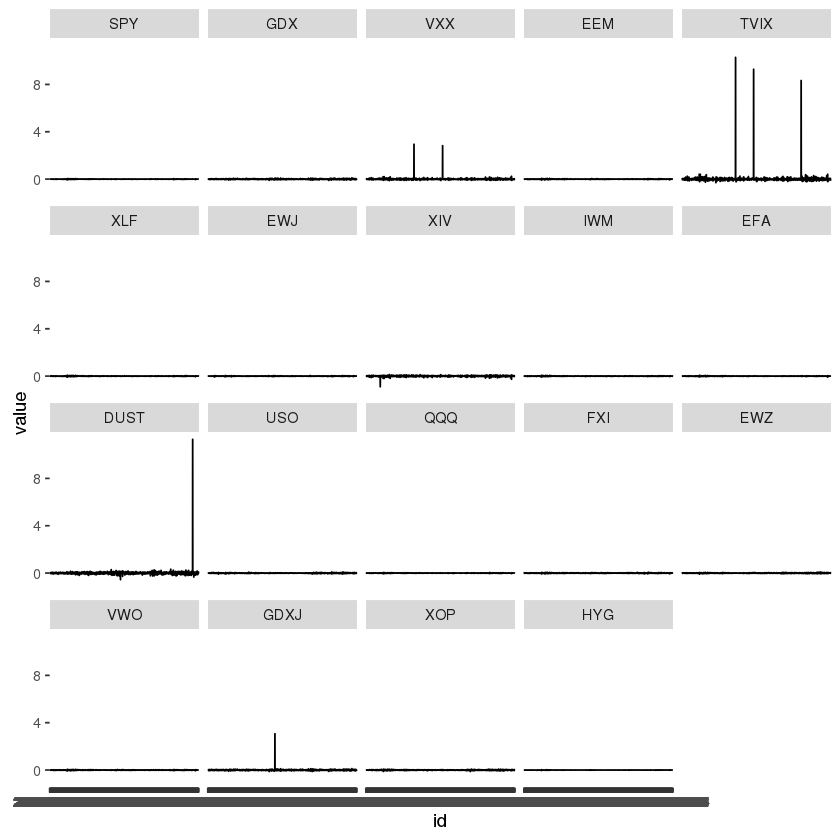

In [35]:
# Plotting with built in
# NOTE: Too much data crashes this funciton... dont run
#plot(returns)

# Plotting with zoo
#plot(zoo(returns))

# Plotting with ggplot2
# NOTE: This is truly painful and the tool is not well documented
library(ggplot2)
library(reshape2)
temp <- returns
temp$id <- rownames(returns)
melted <- melt(temp, id.vars='id')
g <- ggplot(data=melted, aes(x=id, y=value, group=variable)) + geom_line()
#g <- ggplot(data=melted, aes(x=id, y=value)) + geom_line()
g + facet_wrap(~variable)
            
# Plotting with ts
# NOTE: Can't plot this many series
#plot.ts(returns)

Clearly outliers are a problem in this data, but let's not worry about it now. The last thing we'll look at is correlation:

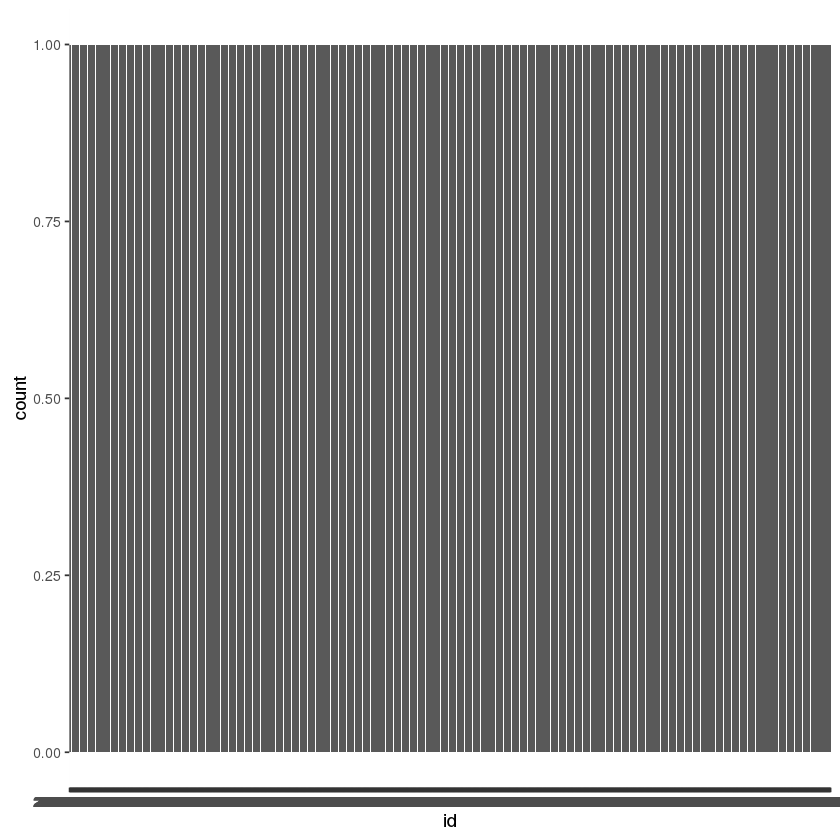

In [37]:
cor(returns)

,SPY,GDX,VXX,EEM,TVIX,XLF,EWJ,XIV,IWM,EFA,DUST,USO,QQQ,FXI,EWZ,VWO,GDXJ,XOP,HYG
SPY,1.00000000,0.18222414,-0.27290013,0.83020588,-0.18074949,0.92418807,0.70276913,0.70837930,0.90999273,0.87970457,-0.03907165,0.41999570,0.92926468,0.70716794,0.62032844,0.82918506,0.08906170,0.69239469,0.72827940
GDX,0.18222414,1.00000000,-0.05373161,0.28942049,-0.02907515,0.12047858,0.12783397,0.12291327,0.19933079,0.22343146,-0.31400765,0.25757403,0.14984178,0.18907846,0.29067163,0.29076244,0.35237541,0.31884793,0.21332248
VXX,-0.27290013,-0.05373161,1.00000000,-0.25231220,0.06536753,-0.24209584,-0.20603429,-0.28458469,-0.24916497,-0.25779538,0.01028389,-0.12728021,-0.26773201,-0.20330258,-0.19429890,-0.25590523,-0.03148523,-0.18761046,-0.22664040
EEM,0.83020588,0.28942049,-0.25231220,1.00000000,-0.11957335,0.77567269,0.67384835,0.59604676,0.77349164,0.86774308,-0.08096779,0.46598703,0.75917077,0.87086619,0.79720162,0.98829039,0.12063690,0.65061788,0.69275680
TVIX,-0.180749488,-0.029075145,0.065367530,-0.119573349,1.000000000,-0.162220184,-0.128953371,-0.170587665,-0.158055998,-0.153358583,0.005556098,-0.055220315,-0.174042659,-0.101029593,-0.099783400,-0.119992987,-0.017502302,-0.103232636,-0.122980332
XLF,0.924188066,0.120478576,-0.242095837,0.775672688,-0.162220184,1.000000000,0.655880878,0.651119310,0.867896041,0.829618478,0.009039585,0.361287245,0.805389528,0.665987991,0.573314460,0.772992246,0.059546720,0.623066200,0.690059490
EWJ,0.70276913,0.12783397,-0.20603429,0.67384835,-0.12895337,0.65588088,1.00000000,0.53239607,0.63758463,0.79854848,-0.02435458,0.31117773,0.64785873,0.59708007,0.49160684,0.67220969,0.08424103,0.49245243,0.53200768
XIV,0.70837930,0.12291327,-0.28458469,0.59604676,-0.17058767,0.65111931,0.53239607,1.00000000,0.65301500,0.64364406,-0.02545727,0.28261880,0.65917305,0.51048093,0.44605845,0.60079242,0.07563164,0.49277016,0.53095405
IWM,0.90999273,0.19933079,-0.24916497,0.77349164,-0.15805600,0.86789604,0.63758463,0.65301500,1.00000000,0.80744405,-0.03367574,0.39967737,0.85804767,0.65633358,0.57282836,0.77058761,0.11467191,0.70266590,0.69534643
EFA,0.87970457,0.22343146,-0.25779538,0.86774308,-0.15335858,0.82961848,0.79854848,0.64364406,0.80744405,1.00000000,-0.04723029,0.44240599,0.79713250,0.73458695,0.66195605,0.85639283,0.11244320,0.64220769,0.71445769


In [38]:
cov(returns)

,SPY,GDX,VXX,EEM,TVIX,XLF,EWJ,XIV,IWM,EFA,DUST,USO,QQQ,FXI,EWZ,VWO,GDXJ,XOP,HYG
SPY,9.260071e-05,4.507314e-05,-3.037023e-04,1.120245e-04,-7.568392e-04,1.145526e-04,8.131595e-05,3.239118e-04,1.109540e-04,1.040422e-04,-1.159647e-04,8.022948e-05,9.660642e-05,1.104170e-04,1.164744e-04,1.105759e-04,7.471820e-05,1.481026e-04,3.631194e-05
GDX,4.507314e-05,6.607080e-04,-1.597246e-04,1.043167e-04,-3.251966e-04,3.988891e-05,3.950999e-05,1.501265e-04,6.491979e-05,7.058536e-05,-2.489442e-03,1.314283e-04,4.160994e-05,7.885935e-05,1.457837e-04,1.035726e-04,7.896573e-04,1.821756e-04,2.841095e-05
VXX,-0.0003037023,-0.0001597246,0.0133744017,-0.0004091620,0.0032894147,-0.0003606302,-0.0002865053,-0.0015638763,-0.0003651086,-0.0003664189,0.0003668186,-0.0002921999,-0.0003345006,-0.0003814929,-0.0004384390,-0.0004101269,-0.0003174478,-0.0004822765,-0.0001358060
EEM,1.120245e-04,1.043167e-04,-4.091620e-04,1.966255e-04,-7.295813e-04,1.400993e-04,1.136156e-04,3.971494e-04,1.374275e-04,1.495466e-04,-3.501782e-04,1.297107e-04,1.150056e-04,1.981425e-04,2.181171e-04,1.920465e-04,1.474784e-04,2.027906e-04,5.033209e-05
TVIX,-0.0007568392,-0.0003251966,0.0032894147,-0.0007295813,0.1893384173,-0.0009092050,-0.0006746957,-0.0035271237,-0.0008714216,-0.0008201494,0.0007456692,-0.0004769801,-0.0008181530,-0.0007133035,-0.0008471870,-0.0007235643,-0.0006639614,-0.0009984775,-0.0002772677
XLF,1.145526e-04,3.988891e-05,-3.606302e-04,1.400993e-04,-9.092050e-04,1.659110e-04,1.015824e-04,3.985216e-04,1.416456e-04,1.313353e-04,3.591228e-05,9.237876e-05,1.120735e-04,1.391907e-04,1.440894e-04,1.379795e-04,6.686882e-05,1.783913e-04,4.605411e-05
EWJ,8.131595e-05,3.950999e-05,-2.865053e-04,1.136156e-04,-6.746957e-04,1.015824e-04,1.445812e-04,3.041897e-04,9.713857e-05,1.180111e-04,-9.032201e-05,7.427564e-05,8.415805e-05,1.164917e-04,1.153388e-04,1.120115e-04,8.830958e-05,1.316201e-04,3.314501e-05
XIV,0.0003239118,0.0001501265,-0.0015638763,0.0003971494,-0.0035271237,0.0003985216,0.0003041897,0.0022579140,0.0003931650,0.0003758937,-0.0003730976,0.0002665856,0.0003383861,0.0003935860,0.0004135682,0.0003956216,0.0003133181,0.0005204752,0.0001307239
IWM,1.109540e-04,6.491979e-05,-3.651086e-04,1.374275e-04,-8.714216e-04,1.416456e-04,9.713857e-05,3.931650e-04,1.605447e-04,1.257407e-04,-1.316049e-04,1.005286e-04,1.174543e-04,1.349364e-04,1.416198e-04,1.353075e-04,1.266728e-04,1.979013e-04,4.565028e-05
EFA,1.040422e-04,7.058536e-05,-3.664189e-04,1.495466e-04,-8.201494e-04,1.313353e-04,1.180111e-04,3.758937e-04,1.257407e-04,1.510536e-04,-1.790371e-04,1.079365e-04,1.058414e-04,1.464924e-04,1.587436e-04,1.458614e-04,1.204833e-04,1.754458e-04,4.549738e-05


## Conclusion
That's it! Today we've seen a lot and only scratched the surface of data analysis in R.
1. Learn about importing and exporting data.
2. Get introduced to the data frame and all its methods.
4. Learn about tools for descriptive statistics on data frames.
5. Study several useful packages for data analysis.

# Homework:

1. Check out [Kaggle](https://www.kaggle.com), a website offering statistical contests with real cash prizes!
2. Download a dataset from the [Kaggle public datasets list](https://www.kaggle.com/datasets), something you think sounds fun. Here are some suggestions:
    * [GoT Deaths](https://www.kaggle.com/mylesoneill/game-of-thrones) - do a statistical study of character deaths! WARNING: Spoilers!
    * [Airplane Crashes](https://www.kaggle.com/saurograndi/airplane-crashes-since-1908) - how likely is it that my next flight will crash? If you successfully predict my plane going down... well I can't give you any prizes in that case...
    * [US College Scorecard](https://www.kaggle.com/kaggle/college-scorecard) -  data released by US government on the cost of higher education in order to crowdsource studies about problems and possible solutions.
    * [San Francisco Public Employee Salaries](https://www.kaggle.com/kaggle/sf-salaries) - data for several years on public employee pay.
    
3. Import your data into R.
4. Print to the screen the column names.
5. Study some descriptive statistics and comment on them.
5. Calculate a group average and add it as a column, e.g. the average life-span of a GoT character conditional on their family... my bet is the Starks have the lowest average life span and the Lannisters the longest!
6. Plot some of your data.
7. Calculate some correlations, e.g. what is the correlation between flight origin and crashing?
8. Output your data to a `.csv` file.